# **Buy Me That Look:-**

# 1.Business problem

<h2>1.1 Description</h2>
<p>Nowadays E fashion influencers regularly post images, and users
might be willing to mimic the looks of their influencers. Generally users
might be interested in buying the entire look of the model. So in this
problem we would like to solve, given a full pose image of a model
,the goal of our method is to recommend similar fashion products
corresponding to the entire set of fashion articles worn by a model in
the full-shot image.</p><br>
<p>we can say that this is challenging because, in contrast to
performing recommendations for a single, primary article (for the
query), we need to recommend similar products for the entire set of
fashion articles worn by a model.</p>



__ Problem Statement __
-  given a full-pose image we need torecommend similar fashion products
corresponding to the entire set of fashion articles present in the  Full-pose image.
- This could provide us good business profits.

<h2> 1.2 Useful Links</h2>

Paper1: https://arxiv.org/pdf/2008.11638.pdf<br>
Dataset: http://www.tamaraberg.com/street2shop/<br>
Blog1: https://blog.tensorflow.org/2018/05/real-time-human-pose-estimation-in.<br>Blog2: https://towardsdatascience.com/how-to-train-a-custom-object-detection-model-with-yolo-v5-917e9ce13208<br>
Blog3: https://towardsdatascience.com/image-similarity-using-triplet-loss-3744c0f67973<br>

# <h1>2. Machine Learning Probelm </h1>

<h2> 2.1 Mapping the real world problem to an DL problem </h2>

The main problem can be divided into subproblems then we can apply DL to solve those subproblems.First a fashion article images uploaded by users then:<br>



*   Human keypoint detection and Pose classification
*   Article localisation and object detection
*   Triplet network based image embedding model
*   retrieving and recommending similar products from our
database using the embedding vector




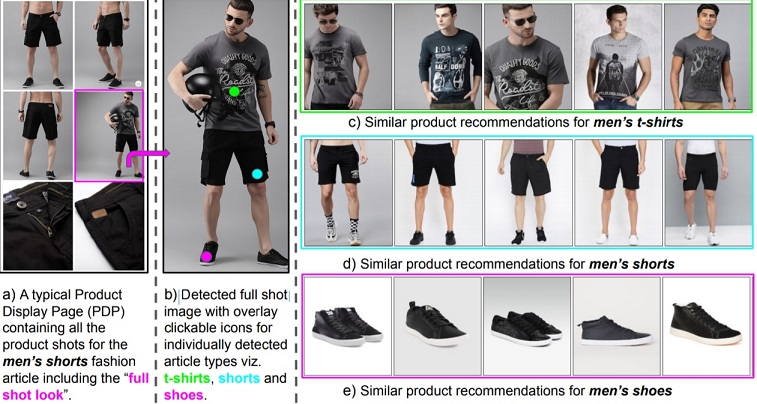

<h2> 2.2 Data </h2>

<h3> 2.2.1 Data Overview </h3>

<p>1. In this task, i will use the Street2Shop dataset because This dataset provides both Street images of models as well as the inshop image of the products worn by the user.</p>
<p>2. This dataset contains 430000 images out of which 20000 street images and rest are inshop images. we can use this inshop images for triplate network and recommending simillar products</p>
</p>3. This dataset contains exact street2shop pairs and the retrieval sets for 11 clothing categories:


*   bags
*   belts
*   dresses
*   eyewear
*   footwear
*   hats
*   leggings
*   outerwear
*   pants
*   skirts
*   tops</p>

In [ ]:
import json
import os
from tqdm import tqdm
import cv2
import matplotlib.pyplot as plt
from itertools import islice
import urllib.request as urllib
from PIL import Image as Image
import pandas as pd
import json
import matplotlib.image
import matplotlib.patches as patches
from collections import Counter
import random
from random import sample
import shutil

# <h1>3. Exploratory Data Analysis </h1>


AS I mentioned The main problem can be divided into subproblems<br>
 



1.   Human keypoint detection and Pose classification
2.   Article localisation and object detection
3.  Triplet network based image embedding model
4.  retrieving and recommending similar products from our
database using the embedding vector

so Below i have performed EDA according to each task





<h3>EDA For Stage1(full pose detection)</h3>

In [ ]:
image_count=0
names=[]
links=[]
with open("Dataset/street2shop/photos/photos.txt","r+") as f:
    while True:
        next_n_lines = list(islice(f, 10000))
        image_count=image_count+1
        if not next_n_lines:
            break
        # process next_n_lines
        for i in next_n_lines:
            names.append(int(i.split(',')[0]))
            links.append((i.split(',')[1])[:-1])
        print("Total no of images ",image_count*10000,end="\r")
data=pd.DataFrame()
data['image_id']=names
data['link']=links
data.head()

,image_id,link
0,1,http://s3.amazonaws.com/media.modcloth/images/...
1,2,http://s3.amazonaws.com/media.modcloth/images/...
2,3,http://s3.amazonaws.com/media.modcloth/images/...
3,4,http://s3.amazonaws.com/media.modcloth/images/...
4,5,http://media1.modcloth.com/community_outfit_im...


In the above cell we got all image id and their image source links in one data frame and we can say that there are total 430000 images are present in the dataset.

In [ ]:
categories=['bags','belts','dresses','eyewear','footwear','hats','leggings','outerwear','pants','skirts','tops']
image_id=[]
product_id=[]
product_type=[]
inshop_df=pd.DataFrame()
for i in categories:
    with open('Dataset/street2shop/meta/meta/json/retrieval_'+i+'.json') as f:
        temp=json.load(f)
        for j in temp:
            image_id.append(j['photo'])
            product_id.append(j['product'])
            product_type.append(i)
inshop_df['image_id']=image_id
inshop_df['product_id']=product_id
inshop_df['product_type']=product_type
print("no of inshope images are",len(set(inshop_df['image_id'])))
inshop_df.head()

no of inshope images are 404483


,image_id,product_id,product_type
0,75161,1,bags
1,75162,1,bags
2,249331,2,bags
3,206867,3,bags
4,371076,4,bags


In [ ]:
def get_sample_inshop(image_id):
    link=data[data.image_id==image_id].link.values[0]
    try:
        urllib.urlretrieve(link, 'Dataset/sample.jpg')
    except:
        return
    img = matplotlib.image.imread("Dataset/sample.jpg")
    figure, ax = plt.subplots(1)
    ax.imshow(img)
    plt.show()

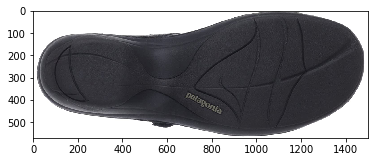

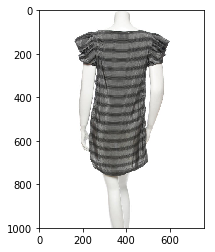

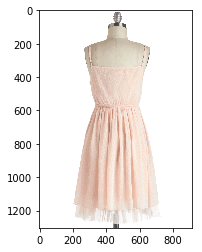

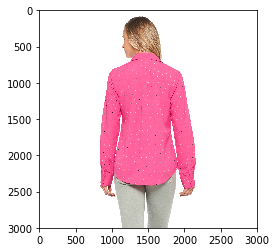

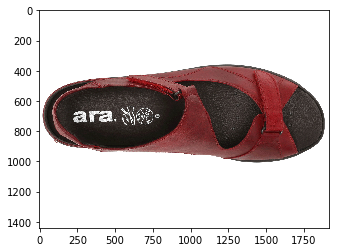

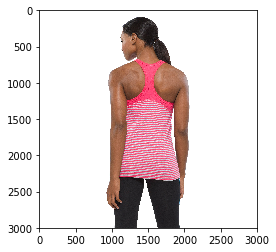

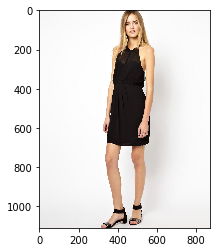

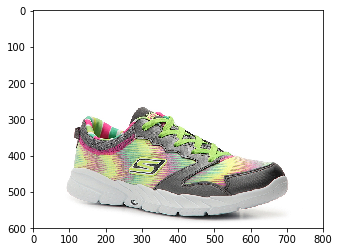

In [ ]:
for i in range(15):
    get_sample_inshop(random.choice(inshop_df['image_id']))

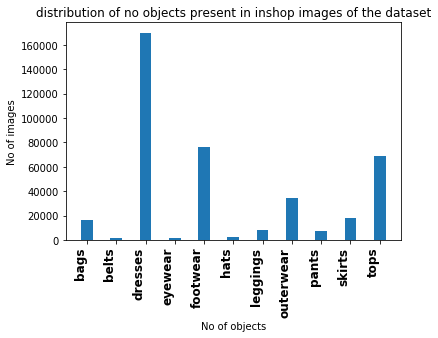

{'bags': 16319,
 'belts': 1252,
 'dresses': 169941,
 'eyewear': 1595,
 'footwear': 75853,
 'hats': 2551,
 'leggings': 8228,
 'outerwear': 34744,
 'pants': 7641,
 'skirts': 18295,
 'tops': 68478}

In [ ]:
no_of_product_per_cat={'bags':0,'belts':0,'dresses':0,'eyewear':0,'footwear':0,'hats':0,'leggings':0,'outerwear':0,'pants':0,'skirts':0,'tops':0}
for i in inshop_df['product_type']:
    no_of_product_per_cat[i]=no_of_product_per_cat[i]+1
plt.bar(no_of_product_per_cat.keys(), no_of_product_per_cat.values(),width = 0.4)
plt.xlabel("No of objects")
plt.ylabel("No of images")
plt.title("distribution of no objects present in inshop images of the dataset")
plt.xticks(range(len(no_of_product_per_cat.keys())), no_of_product_per_cat.keys(), rotation=90, fontweight='bold', fontsize='12', horizontalalignment='right')
plt.show()
no_of_product_per_cat

1.From above we can say that we are heaving 404483 no of inshop images.<br>
2.from the images we can say that generally the inshop images are contaln one object.which means in other words we can map multiple inshop image to one street images.<br>
3.From the distribution graph we can say that we have more inshope imges on dresses as compared to other category<br>

In [ ]:
image_id=[]
product_id=[]
product_type=[]
b_box=[]
street_df=pd.DataFrame()
for i in categories:
    for j in ['train','test']:
        with open('Dataset/street2shop/meta/meta/json/'+j+'_pairs_'+i+'.json') as f:
            temp=json.load(f)
            for k in temp:
                image_id.append(k['photo'])
                product_id.append(k['product'])
                product_type.append(i)
                b_box.append(k['bbox'])
street_df['image_id']=image_id
street_df['product_id']=product_id
street_df['product_type']=product_type
street_df['bbox']=b_box
street_df = street_df.groupby(['image_id']).apply(lambda x: [list(x['product_id']), list(x['product_type']),list(x['bbox'])]).apply(pd.Series).reset_index()
street_df.columns =['image_id','product_id','product_type','bbox']
print("Total no of street images are ",len(street_df['image_id']))
street_df.head()

Total no of street images are  20357


,image_id,product_id,product_type,bbox
0,1,"[65901, 14177]","[dresses, footwear]","[{'width': 755, 'top': 143, 'left': 560, 'heig..."
1,2,[2808],[footwear],"[{'width': 253, 'top': 2246, 'height': 216, 'l..."
2,3,[3136],[skirts],"[{'width': 478, 'top': 429, 'height': 411, 'le..."
3,4,[47942],[dresses],"[{'width': 760, 'top': 847, 'left': 462, 'heig..."
4,5,"[5235, 5904]","[dresses, footwear]","[{'width': 133, 'top': 130, 'left': 345, 'heig..."


In [ ]:
def draw_full_image(image_id,street_df):
    link=data[data.image_id==image_id].link.values[0]
    urllib.urlretrieve(link, 'Dataset/sample.jpg')
    img = matplotlib.image.imread("Dataset/sample.jpg")
    img_data=street_df[street_df.image_id==image_id]
    no_of_image=len(img_data.product_id.values[0])
    figure, ax = plt.subplots(1)
    for i in range(no_of_image):
        height=img_data.bbox.values[0][i]['height']
        width=img_data.bbox.values[0][i]['width']
        x=img_data.bbox.values[0][i]['left']
        y=img_data.bbox.values[0][i]['top']
        cat_type=img_data.product_type.values[0][i]
        rect = patches.Rectangle((x,y),width,height, edgecolor='y', facecolor="none")
        ax.add_patch(rect)
        ax.text(x, y,cat_type , style='normal',bbox={'facecolor': 'yellow', 'alpha': 1, 'pad': 2})
    ax.imshow(img)
    plt.show()

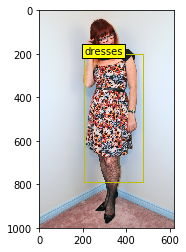

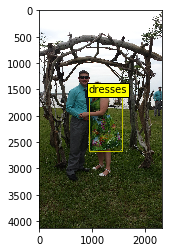

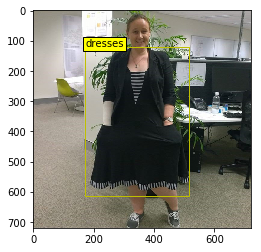

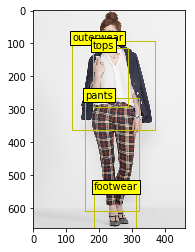

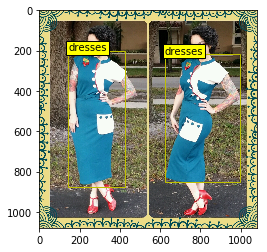

...

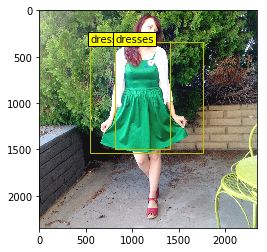

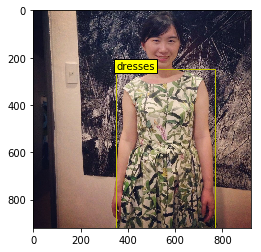

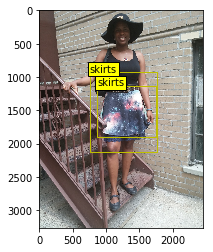

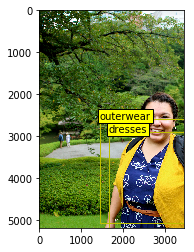

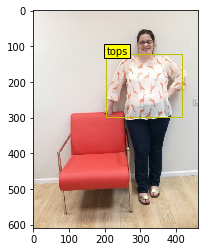

In [ ]:

for i in range(15):
    draw_full_image(random.choice(street_df['image_id']),street_df)

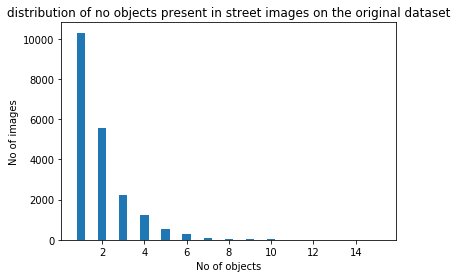

Counter({2: 5549,
         1: 10313,
         3: 2223,
         6: 305,
         5: 526,
         4: 1212,
         7: 100,
         10: 19,
         12: 5,
         9: 37,
         8: 55,
         11: 8,
         13: 4,
         15: 1})

In [ ]:
no_of_image_per_image=[]
for i in street_df['product_id']:
    no_of_image_per_image.append(len(i))
no_of_image_per_image=Counter(no_of_image_per_image)
plt.bar(no_of_image_per_image.keys(), no_of_image_per_image.values(),width = 0.4)
plt.xlabel("No of objects")
plt.ylabel("No of images")
plt.title("distribution of no objects present in street images on the original dataset")
plt.show()
no_of_image_per_image

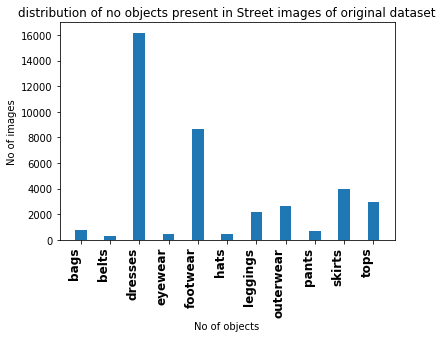

{'bags': 753,
 'belts': 324,
 'dresses': 16167,
 'eyewear': 496,
 'footwear': 8664,
 'hats': 486,
 'leggings': 2158,
 'outerwear': 2611,
 'pants': 730,
 'skirts': 3941,
 'tops': 2936}

In [ ]:
no_of_product_per_cat={'bags':0,'belts':0,'dresses':0,'eyewear':0,'footwear':0,'hats':0,'leggings':0,'outerwear':0,'pants':0,'skirts':0,'tops':0}
for i in street_df['product_type']:
    for j in i:
        no_of_product_per_cat[j]=no_of_product_per_cat[j]+1
plt.bar(no_of_product_per_cat.keys(), no_of_product_per_cat.values(),width = 0.4)
plt.xlabel("No of objects")
plt.ylabel("No of images")
plt.title("distribution of no objects present in Street images of original dataset")
plt.xticks(range(len(no_of_product_per_cat.keys())), no_of_product_per_cat.keys(), rotation=90, fontweight='bold', fontsize='12', horizontalalignment='right')
plt.show()
no_of_product_per_cat

1.From above we have 20357 street images and from above images we can say that street images are heaving more than one products.<br>
2.then we have ploted distribution of no objects present in street images 50% of images consist one object(i.e. dresses) and other 50 % of images contain multiple images.<br>
3.Then we have ploted distribution of no objects categorys in the street images and from the plot we can say we have more images that contain dress and footware as compared to other.<br>
4.From the images we can say that the dataset is not annoteted properly<br>

Below we are Downloading the Street images from the image links

In [ ]:
from multiprocessing import Pool
total_street_images_id=street_df['image_id'].values
def get_data(image_id):
    name=str(image_id)+'.jpg'
    link=data[data['image_id']==image_id].link.values[0]
    urllib.urlretrieve(link, "Dataset/street2shop/images/"+name)
if __name__ == '__main__':
    with Pool(32) as p:
        p.map(get_data, total_street_images_id)

'from multiprocessing import Pool\ntotal_street_images_id=street_df[\'image_id\'].values\ndef get_data(image_id):\n    name=str(image_id)+\'.jpg\'\n    link=data[data[\'image_id\']==image_id].link.values[0]\n    urllib.urlretrieve(link, "Dataset/street2shop/images/"+name)\nif __name__ == \'__main__\':\n    with Pool(32) as p:\n        tqdm(p.map(get_data, total_street_images_id), total=len(total_street_images_id))'

In [ ]:
from multiprocessing import Pool
total_street_images_id=street_df['image_id'].values
def get_data(image_id):
    name=str(image_id)+'.jpg'
    link=data[data['image_id']==image_id].link.values[0]
    urllib.urlretrieve(link, "Dataset/street2shop/images/"+name)
if __name__ == '__main__':
    with Pool(32) as p:
        p.map(get_data, total_street_images_id)

<h3>EDA For Stage2(object detection)</h3>

1.First we have filtered full pose images from Street images and stored in a new folder(i.e.full_pose_images)<br>
2.In the second stage i will train a coustom object detetion model to detact different objects present in the full pose image.<br>
2.Know more about how we have filter full pose image you can refer the stage1.ipynb file.

In [ ]:
files=os.listdir('Dataset/street2shop/full_pose_images/')
full_pose_image_id=[]
for i in files:
    full_pose_image_id.append(int(i[:-4]))
full_pose_df=pd.DataFrame()
full_pose_df['image_id']=full_pose_image_id
full_pose_df=pd.merge(full_pose_df,street_df,on='image_id',how='inner')
print("Total no of full pose street images ",len(full_pose_df['image_id']))
full_pose_df.head()

Total no of full pose street images  9133


,image_id,product_id,product_type,bbox
0,10,"[41018, 41018]","[footwear, footwear]","[{'width': 204, 'top': 2826, 'height': 403, 'l..."
1,100,[6157],[tops],"[{'width': 1085, 'top': 600, 'left': 646, 'hei..."
2,1000,"[276, 276, 12981]","[hats, hats, outerwear]","[{'width': 115, 'top': 219, 'height': 87, 'lef..."
3,10004,"[56576, 29812]","[dresses, footwear]","[{'width': 469, 'top': 570, 'left': 471, 'heig..."
4,10005,[44236],[dresses],"[{'width': 1262, 'top': 2039, 'left': 2082, 'h..."


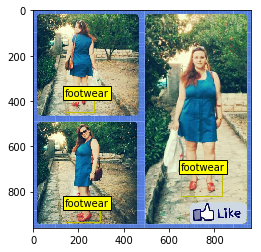

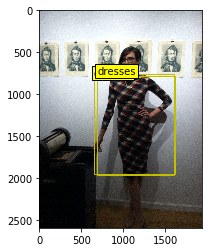

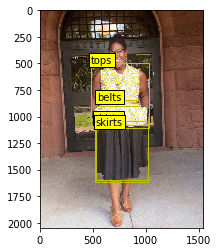

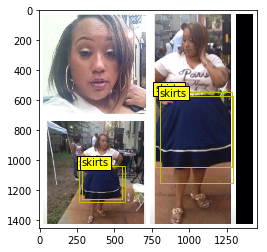

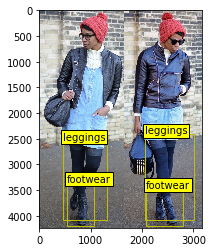

...

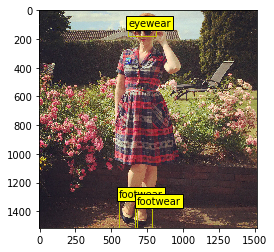

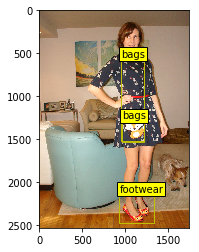

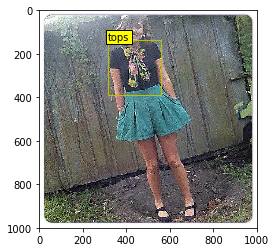

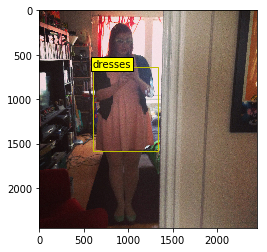

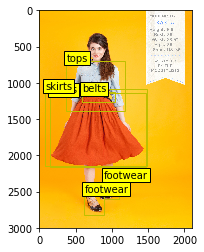

In [ ]:
for i in range(15):
    draw_full_image(random.choice(full_pose_df['image_id']),full_pose_df)

1.From the above we got 9133 full pose images.which is around 45% percent of street images initally we have.<br>
2.From the Sample image what we can say is our posenet is woking well and some images we also got multiple persons. 

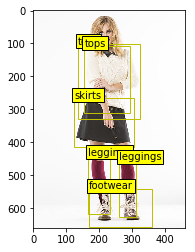

In [ ]:
draw_full_image(9000,full_pose_df)

1.From above we can observe that sometimes same object having multiple bounding boxs. Because in this dataset they are giving boundig box to each inshop image present in street images.<br>
2.Generally one object can avaliable in different shop so here for the same object sometimes we are heaving multiple product_ids.<br>
3.So below i have done some pre processing to remove multiple bounding boxs for same object using the IOU score


In [ ]:
def get_iou(rect1,rect2):
    xA = max(rect1[0],rect2[0]) 
    yA = max(rect1[1],rect2[1])
    xB = min(rect1[2],rect2[2])
    yB = min(rect1[3],rect2[3])
 
    # respective area of ​​the two boxes
    boxAArea=(rect1[2]-rect1[0])*(rect1[3]-rect1[1])
    boxBArea=(rect2[2]-rect2[0])*(rect2[3]-rect2[1])
 
     # overlap area
    interArea=max(xB-xA,0)*max(yB-yA,0)
 
     # IOU
    iou = interArea/(boxAArea+boxBArea-interArea)
    return iou

In [ ]:
def remove_duplicate_bbox(product_ids,product_types,bboxs):
    for idx,val in enumerate(product_ids):
         if idx<len(product_ids)-1:
            for i in range(idx+1,len(product_ids)):
                dup=[]
                if product_types[idx]==product_types[i] and product_types[idx]!='footwear':
                    rect1=[bboxs[idx]['left'],bboxs[idx]['top'],bboxs[idx]['left']+bboxs[idx]['width'],bboxs[idx]['top']+bboxs[idx]['height']]
                    rect2=[bboxs[i]['left'],bboxs[i]['top'],bboxs[i]['left']+bboxs[i]['width'],bboxs[i]['top']+bboxs[i]['height']]
                    if get_iou(rect1,rect2)>.6:
                        dup.append(i)
            if len(dup)!=0:
                for i in dup:
                    product_ids.pop(i)
                    product_types.pop(i)
                    bboxs.pop(i)
                    #        i=i-1                    
    return product_ids,product_types,bboxs

In [ ]:
product_ids=[]
product_types=[]
bboxs=[]
for index,row in full_pose_df.iterrows():
    product_id=row.product_id.copy()
    product_type=row.product_type.copy()
    bbox=row.bbox.copy()
    product_id,product_type,bbox=remove_duplicate_bbox(product_id,product_type,bbox)
    product_ids.append(product_id)
    product_types.append(product_type)
    bboxs.append(bbox)
clean_full_pose_df=pd.DataFrame()
clean_full_pose_df['image_id']=full_pose_df['image_id']
clean_full_pose_df['product_id']=product_ids
clean_full_pose_df['product_type']=product_types
clean_full_pose_df['bbox']=bboxs
clean_full_pose_df.head()

,image_id,product_id,product_type,bbox
0,10,"[41018, 41018]","[footwear, footwear]","[{'width': 204, 'top': 2826, 'height': 403, 'l..."
1,100,[6157],[tops],"[{'width': 1085, 'top': 600, 'left': 646, 'hei..."
2,1000,"[276, 276, 12981]","[hats, hats, outerwear]","[{'width': 115, 'top': 219, 'height': 87, 'lef..."
3,10004,"[56576, 29812]","[dresses, footwear]","[{'width': 469, 'top': 570, 'left': 471, 'heig..."
4,10005,[44236],[dresses],"[{'width': 1262, 'top': 2039, 'left': 2082, 'h..."


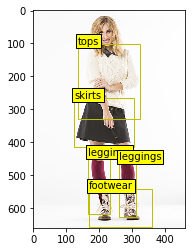

In [ ]:
draw_full_image(9000,clean_full_pose_df)

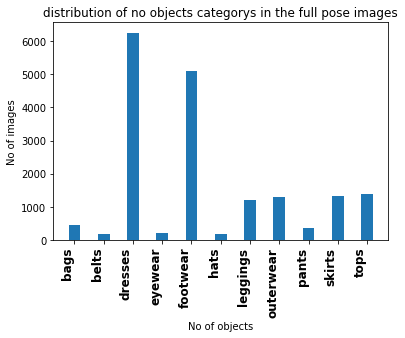

{'bags': 465,
 'belts': 164,
 'dresses': 6252,
 'eyewear': 218,
 'footwear': 5114,
 'hats': 187,
 'leggings': 1211,
 'outerwear': 1286,
 'pants': 375,
 'skirts': 1318,
 'tops': 1381}

In [ ]:
no_of_product_per_cat={'bags':0,'belts':0,'dresses':0,'eyewear':0,'footwear':0,'hats':0,'leggings':0,'outerwear':0,'pants':0,'skirts':0,'tops':0}
for i in clean_full_pose_df['product_type']:
    for j in i:
        no_of_product_per_cat[j]=no_of_product_per_cat[j]+1
plt.bar(no_of_product_per_cat.keys(), no_of_product_per_cat.values(),width = 0.4)
plt.xlabel("No of objects")
plt.ylabel("No of images")
plt.title("distribution of no objects categorys in the full pose images")
plt.xticks(range(len(no_of_product_per_cat.keys())), no_of_product_per_cat.keys(), rotation=90, fontweight='bold', fontsize='12', horizontalalignment='right')
plt.show()
no_of_product_per_cat

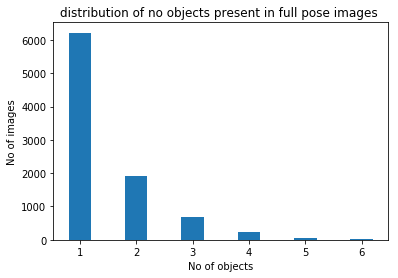

Counter({1: 6216, 2: 1914, 4: 239, 3: 684, 5: 69, 6: 11})

In [ ]:
no_of_image_per_image=[]
for i in clean_full_pose_df['product_type']:
    no_of_image_per_image.append(len(set(i)))
no_of_image_per_image=Counter(no_of_image_per_image)
plt.bar(no_of_image_per_image.keys(), no_of_image_per_image.values(),width = 0.4)
plt.xlabel("No of objects")
plt.ylabel("No of images")
plt.title("distribution of no objects present in full pose images ")
plt.show()
no_of_image_per_image

1.Form above plots we can say that distribution of no objects categorys is same as previous.<br>
2.When we see the distribution of no objects we got around 5000 images contain single object but generally in full pose image we get more than one fahion items.<br>
3.below i have done some analysis related to full pose images that are heaving single object.

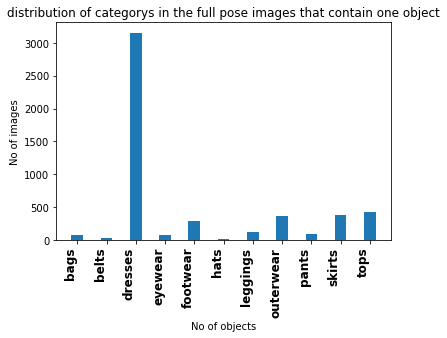

{'bags': 78,
 'belts': 27,
 'dresses': 3152,
 'eyewear': 75,
 'footwear': 289,
 'hats': 15,
 'leggings': 123,
 'outerwear': 359,
 'pants': 87,
 'skirts': 382,
 'tops': 431}

In [ ]:
product_cat={'bags':0,'belts':0,'dresses':0,'eyewear':0,'footwear':0,'hats':0,'leggings':0,'outerwear':0,'pants':0,'skirts':0,'tops':0}
for index,row in clean_full_pose_df.iterrows():
    if len(row['product_type'])==1:
        for j in row['product_type']:
            product_cat[j]=product_cat[j]+1
plt.bar(product_cat.keys(), product_cat.values(),width = 0.4)
plt.xlabel("No of objects")
plt.ylabel("No of images")
plt.title("distribution of categorys in the full pose images that contain one object")
plt.xticks(range(len(product_cat.keys())), product_cat.keys(), rotation=90, fontweight='bold', fontsize='12', horizontalalignment='right')
plt.show()
product_cat

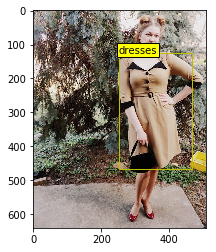

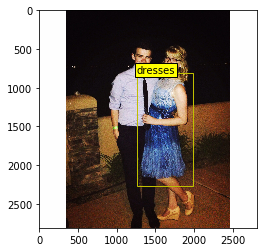

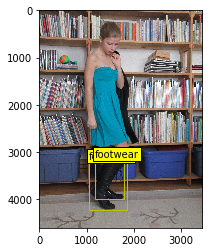

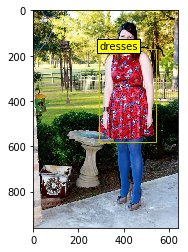

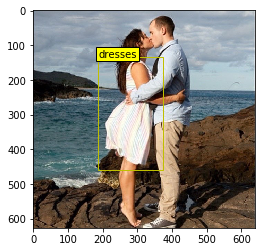

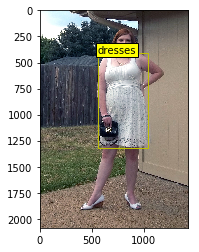

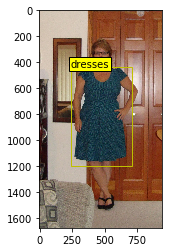

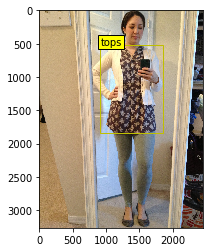

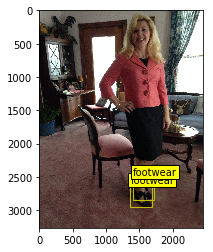

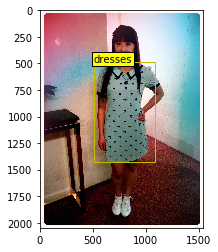

In [ ]:
single_obj_img_id=[]
for index,row in clean_full_pose_df.iterrows():
    if len(set(row['product_type']))==1:
        single_obj_img_id.append(row['image_id'])
for i in range(10):
    draw_full_image(random.choice(single_obj_img_id),clean_full_pose_df)

1. In the above images we can observe that for the image contain single object are not well annoted.<br>
2. So here i will remove the images that contain single object.

In [ ]:
files=os.listdir('Dataset/street2shop/full_pose_images/')
for i in tqdm(files):
    id =int(i[:-4])
    if id not in single_obj_img_id:
        shutil.copy('Dataset/street2shop/full_pose_images/'+i, 'Dataset/street2shop/custom_obj_detection/')

100%|█████████████████████████████████████████████████████████████████████████████| 9133/9133 [00:34<00:00, 261.85it/s]


In [ ]:
no_of_images=len(os.listdir('Dataset/street2shop/custom_obj_detection/'))
print("Total no of images for object detection is",no_of_images)

Total no of images for object detection is 2917


<h3>EDA For Stage3(image embedding model)</h3>

<h3>Triplate Model:-

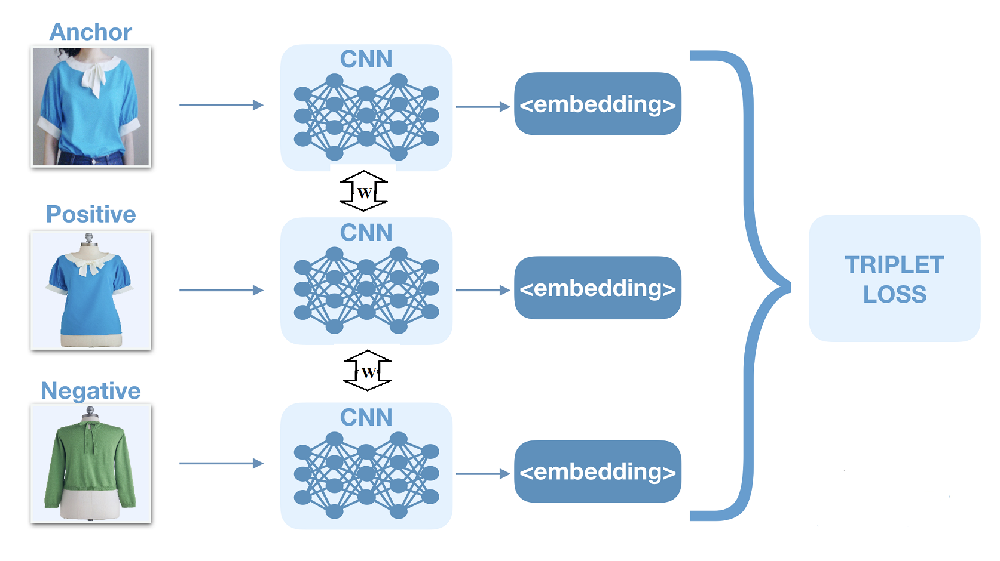

<h3>Triplate Loss:

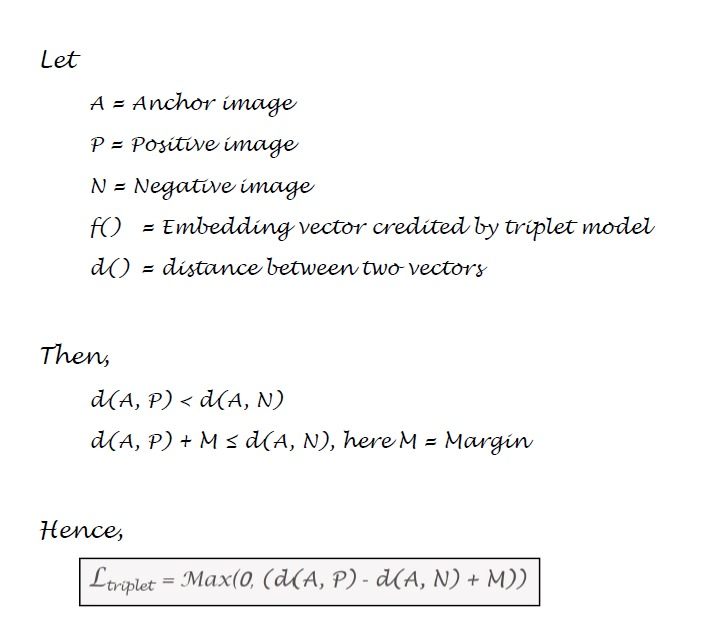

1. As we discussed above one product image can have multiple inshop images.
2. let say we predict top 5 similar image for an quary image.
3. then using the inshop images of that quary image,we can measure the performance of the model
4. Along with the Triplate loss ,we can also compute the pression of the model on test set.

In [ ]:
def get_all_inshop_image(image_id):
    name=str(image_id)+"_"
    img = Image.open("/content/drive/MyDrive/full_pose_images/"+str(image_id)+".jpg")
    temp=full_pose_df[full_pose_df['image_id']==image_id]
    visited=[]
    for i in range(len(temp.product_id.values[0])):
        product_id=temp.product_id.values[0][i]
        product_type=temp.product_type.values[0][i]
        str1=str(product_id)+"_"+product_type
        bbox=temp.bbox.values[0][i]
        img_res = img.crop((bbox['left'], bbox['top'], bbox['left']+bbox['width'],bbox['top']+bbox['height'])) 
        if str1 not in visited:
            visited.append(str1)
            temp2_pos=inshop_df[(inshop_df['product_id']==product_id) & (inshop_df['product_type']==product_type)]
            for i in range(len(list(temp2_pos['image_id'].values))):
                pos_img_id=list(temp2_pos['image_id'].values)[i]
                temp2_neg=inshop_df[inshop_df['product_type']==product_type]
                temp2_neg=list(temp2_neg['image_id'].values)
                try:
                    link=data[data.image_id==pos_img_id].link.values[0]
                    urllib.urlretrieve(link, "/content/drive/MyDrive/Triplate/pos/"+str(image_id)+'_'+str(product_id)+"_"+str(pos_img_id)+'.jpg')
                    flag=False
                    while(flag!=True):
                        try:
                            ran=random.choice(temp2_neg)
                            link=data[data.image_id==ran].link.values[0]
                            urllib.urlretrieve(link, "/content/drive/MyDrive/Triplate/neg/"+str(image_id)+'_'+str(product_id)+"_"+str(pos_img_id)+'.jpg')
                            flag=True
                        except:
                            continue
                    img_res.save('/content/drive/MyDrive/Triplate/Anchor/'+str(image_id)+'_'+str(product_id)+"_"+str(pos_img_id)+'.jpg')
                except:
                    continue
    os.remove("/content/drive/MyDrive/full_pose_images/"+str(image_id)+".jpg")

In [ ]:
image_ids=os.listdir('/content/drive/MyDrive/full_pose_images/')
total_street_images_id=[]
for i in image_ids:
    total_street_images_id.append(int(i[:-4]))
from multiprocessing import Pool
if __name__ == '__main__':
    with Pool(32) as p:
        p.map(get_all_inshop_image, total_street_images_id)

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [59:39<00:00, 35.79s/it]


1. Here above we collected all triplate pair and the data set is consist of around 40000 triplate pairs.
2. Below, we have sown some sample triplate images.

In [ ]:
def show_sample_Triplate_image(no):
    files=os.listdir('Dataset/street2shop/Triplate/Anchor')
    for i in range(no):
            name=random.choice(files)
            img1 = plt.imread('Dataset/street2shop/Triplate/Anchor/'+name)
            img2 = plt.imread('Dataset/street2shop/Triplate/pos/'+name)
            img3 = plt.imread('Dataset/street2shop/Triplate/neg/'+name)
            f, ax = plt.subplots(1, 3, figsize=(16,6))
            ax[0].imshow(img1)
            ax[1].imshow(img2)
            ax[2].imshow(img3)
            ax[0].set_title('anchor')
            ax[1].set_title('positive')
            ax[2].set_title('negative')
            plt.show()
    

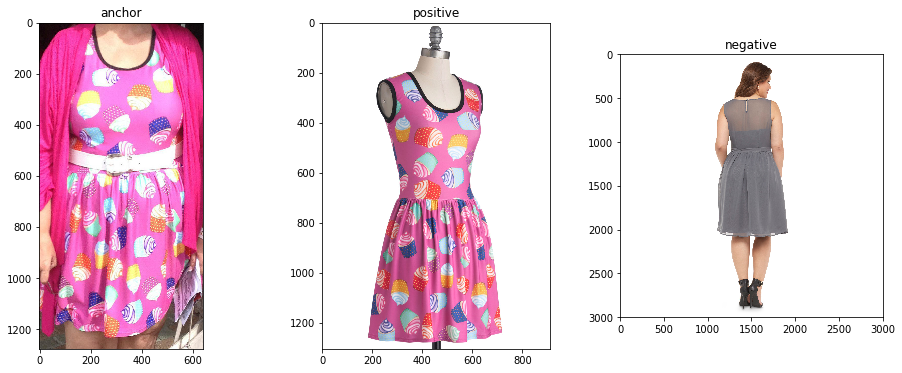

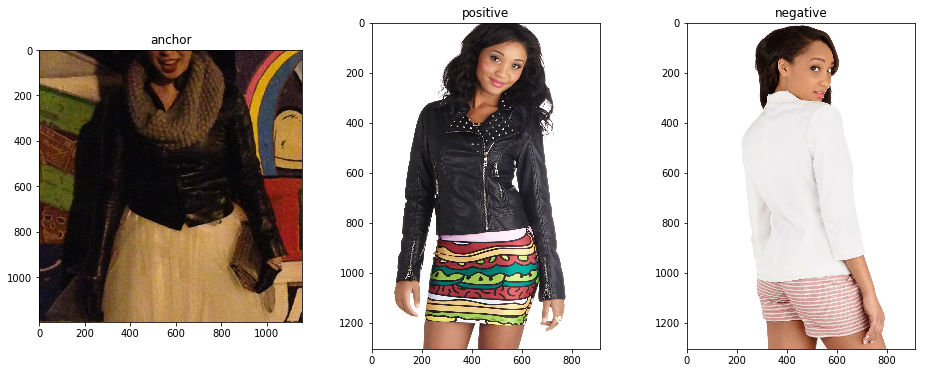

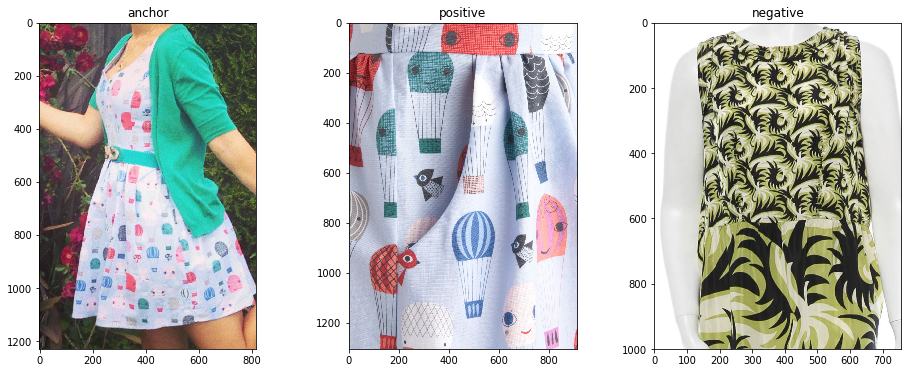

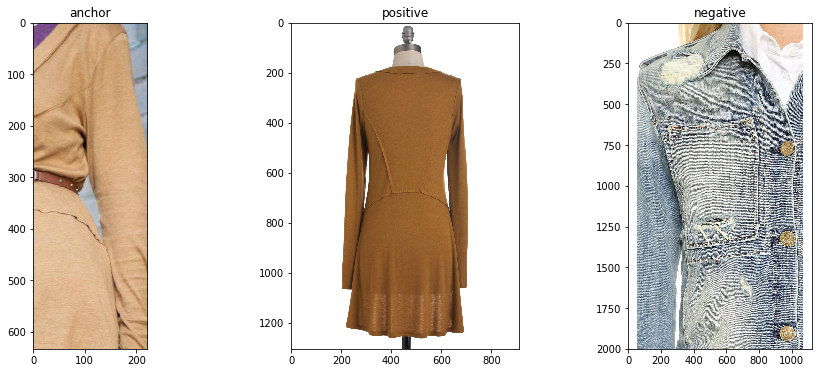

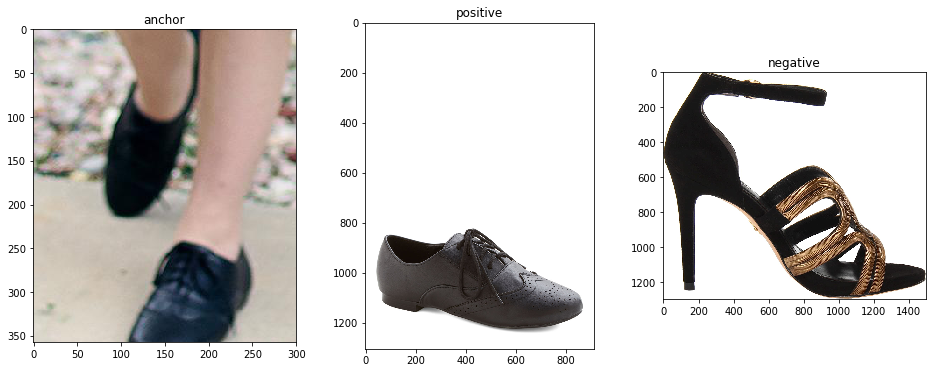

...

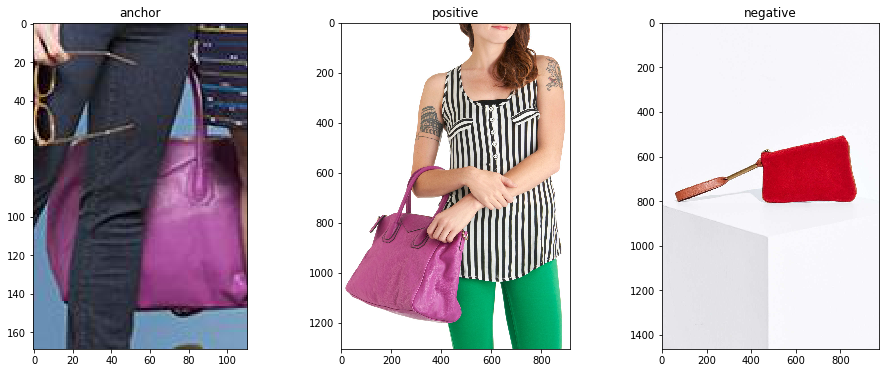

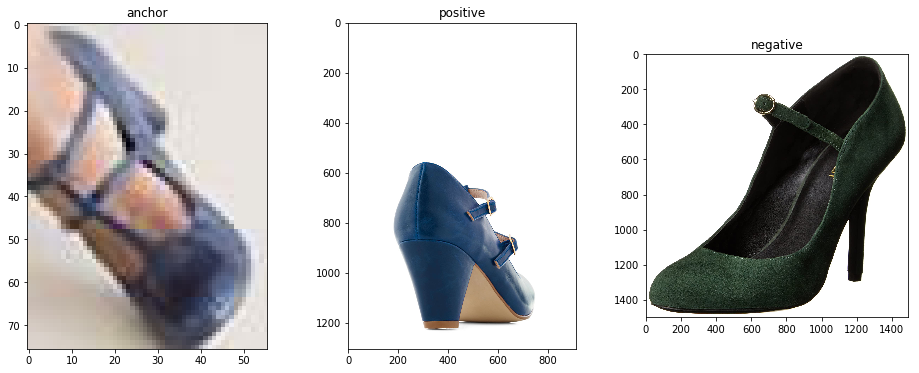

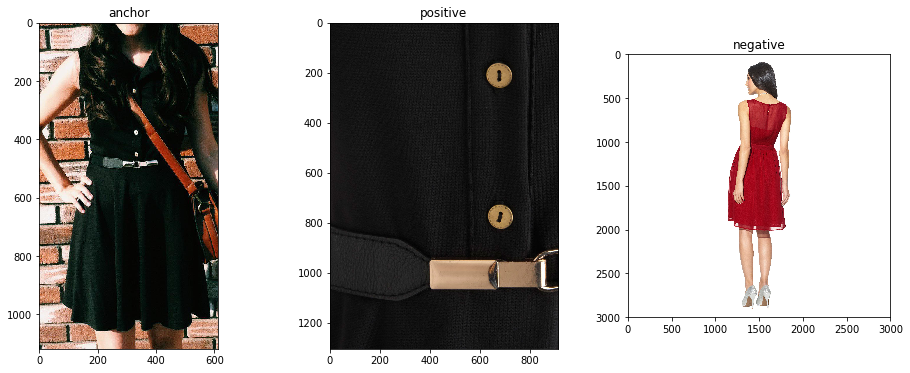

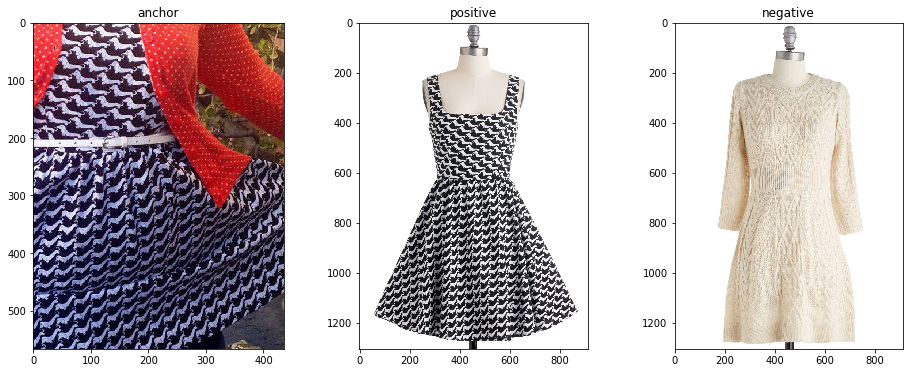

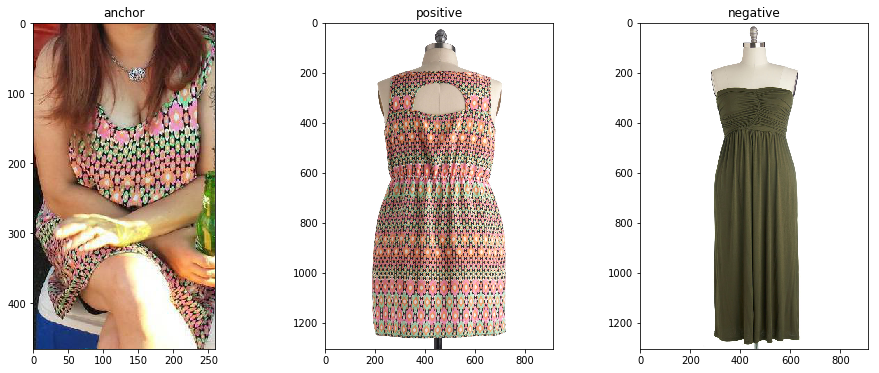

In [ ]:
show_sample_Triplate_image(15)


# Conclusion

1. First we used pose-net model to identify full-ose image. using this trained pose-net model,i am able to get arround 9000 full pose image.
2. Then we preprossed this image and remove some images. After preprocessing we are prepared the data set of 3000 images for coustom object detection model.
3. From the above EDA we come to know that many images of dresses as compared to other category.
4. Then using the inshop images we created a dataset for Triplate network for to generate the embedding vector.